In [1]:
import os

import numpy as np
import pandas as pd

# import warnings
# warnings.filterwarnings("ignore")
from IPython.core.interactiveshell import InteractiveShell

InteractiveShell.ast_node_interactivity = "all"
import matplotlib.pyplot as plt

%matplotlib inline
import plotly.express as px
import seaborn as sns
import sklearn
from sklearn import metrics
import tensorflow as tf
import tensorflow_addons as tfa
from PIL import Image
from tensorflow import keras
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow.keras.layers import (
    AveragePooling2D,
    AvgPool2D,
    Conv2D,
    Dense,
    Flatten,
    GlobalAveragePooling2D,
    MaxPooling2D,
)
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [6]:
# IMG_PATH = '/app/_data/train_images/small_bicubic/'
IMG_PATH = '/app/_data/train_images/'
# MODEL_PATH = '/app/_data/models/effnet7_1_5class.h5'
# feature_columns = ['complex', 'frog_eye_leaf_spot', 'healthy', 'powdery_mildew', 'rust', 'scab']
# feature_columns = ['complex', 'frog_eye_leaf_spot', 'powdery_mildew', 'rust', 'scab']
PATH = "/app/_data/"
BATCH_SIZE = 4
# SEED = 1488
SEED = 42
IMAGE_SIZE = (600, 600)
NUM_CLASSES = 6
INPUT_SHAPE = (600, 600, 3)
# MODEL_PATH = '/app/_data/models/base_model_0005_bicubic.h5'
MODEL_PATH = '/app/_data/models/eff4_1.h5'

In [ ]:
img = Image.open(IMG_PATH+'ead085dfac287263.jpg')
# img

In [8]:
labels = pd.read_csv('/app/_data/df_csv/labels_21_20_plus_test20_without_complex.csv', index_col=[0])


In [9]:
labels.query('image =="ead085dfac287263.jpg"')

,image,labels,complex,frog_eye_leaf_spot,healthy,powdery_mildew,rust,scab
15103,ead085dfac287263.jpg,frog_eye_leaf_spot,0,1,0,0,0,0


In [4]:
# model = keras.models.load_model(MODEL_PATH)

In [5]:
labels.sample()

,image,labels,complex,frog_eye_leaf_spot,healthy,powdery_mildew,rust,scab
6715,b0791fdf173198a0.jpg,healthy,0,0,1,0,0,0


In [13]:
data = pd.DataFrame()
for path in os.listdir('/app/sandbox/wrong_predictions/eff4/'):
    df = pd.read_csv('/app/sandbox/wrong_predictions/eff4/'+path, index_col=[0])
    if 'labels_pred' in df.columns.tolist() and 'labels_true' in df.columns.tolist():
        df = df[df['labels_pred']!=df['labels_true']]
        data = pd.concat([data, df], axis=0, ignore_index=True)

In [14]:
list_wr = data['image'].value_counts()[data['image'].value_counts()>7].index.tolist()

In [15]:
# a = pd.read_csv('/app/sandbox/wrong_predictions/eff4/wrong_eff4_ns.csv',index_col=[0])

In [16]:
data = data.query('image in @list_wr')

In [17]:
data = data.join(data['labels_pred'].str.get_dummies(' ')).join(data['labels_true'].str.get_dummies(' '), rsuffix = '_true')

In [18]:
data.sample()

,image,labels_pred,labels_true,complex,frog_eye_leaf_spot,healthy,powdery_mildew,rust,scab,complex_true,frog_eye_leaf_spot_true,healthy_true,powdery_mildew_true,rust_true,scab_true
12967,b590496c83f349f5.jpg,frog_eye_leaf_spot scab,scab frog_eye_leaf_spot,0,1,0,0,0,1,0,1,0,0,0,1


In [19]:
data.groupby('image')

In [20]:
dp = data.pivot_table(index='image', aggfunc='sum')

In [21]:
dp.head(10)

,complex,complex_true,frog_eye_leaf_spot,frog_eye_leaf_spot_true,healthy,healthy_true,powdery_mildew,powdery_mildew_true,rust,rust_true,scab,scab_true
image,,,,,,,,,,,,
8002cb321f8bfcdf.jpg,12,13,5,13,0,0,0,0,0,0,6,13
806878cdcb8df99a.jpg,11,13,5,13,0,0,0,0,0,0,5,13
80769797ce42f658.jpg,1,0,13,13,0,0,0,0,0,0,4,13
8079176b1b970bda.jpg,0,0,9,0,0,0,0,0,0,0,8,9
8085d341ee57f03f.jpg,1,0,11,0,0,0,0,0,0,0,9,11
808734da3f595b59.jpg,11,13,9,13,0,0,0,0,0,0,1,0
809106ca5fc7735f.jpg,0,8,0,0,0,0,0,0,8,0,0,0
80933fcc6a673636.jpg,0,0,6,13,0,0,0,0,13,13,0,0
809495769b64f3b5.jpg,3,13,0,0,0,0,13,13,0,0,0,0


In [23]:
dp.shape

(2059, 12)

In [24]:
# dp.to_csv('/app/sandbox/wrong_predictions/eff4/wrong_eff4_ids.csv')

{'complex': 12,
 'complex_true': 13,
 'frog_eye_leaf_spot': 5,
 'frog_eye_leaf_spot_true': 13,
 'healthy': 0,
 'healthy_true': 0,
 'powdery_mildew': 0,
 'powdery_mildew_true': 0,
 'rust': 0,
 'rust_true': 0,
 'scab': 6,
 'scab_true': 13}

8002cb321f8bfcdf.jpg


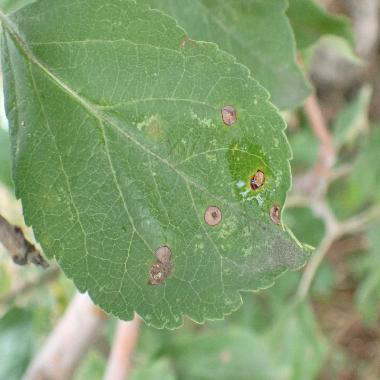

{'complex': 11,
 'complex_true': 13,
 'frog_eye_leaf_spot': 5,
 'frog_eye_leaf_spot_true': 13,
 'healthy': 0,
 'healthy_true': 0,
 'powdery_mildew': 0,
 'powdery_mildew_true': 0,
 'rust': 0,
 'rust_true': 0,
 'scab': 5,
 'scab_true': 13}

806878cdcb8df99a.jpg


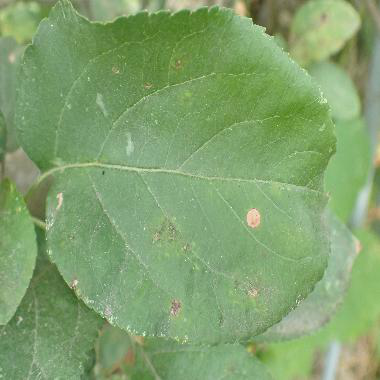

{'complex': 1,
 'complex_true': 0,
 'frog_eye_leaf_spot': 13,
 'frog_eye_leaf_spot_true': 13,
 'healthy': 0,
 'healthy_true': 0,
 'powdery_mildew': 0,
 'powdery_mildew_true': 0,
 'rust': 0,
 'rust_true': 0,
 'scab': 4,
 'scab_true': 13}

80769797ce42f658.jpg


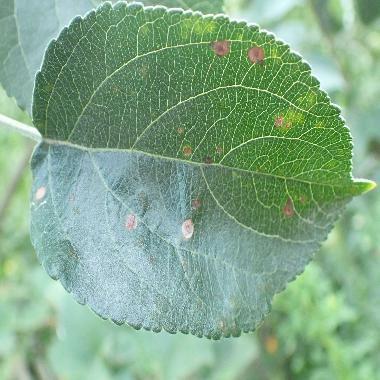

{'complex': 0,
 'complex_true': 0,
 'frog_eye_leaf_spot': 9,
 'frog_eye_leaf_spot_true': 0,
 'healthy': 0,
 'healthy_true': 0,
 'powdery_mildew': 0,
 'powdery_mildew_true': 0,
 'rust': 0,
 'rust_true': 0,
 'scab': 8,
 'scab_true': 9}

8079176b1b970bda.jpg


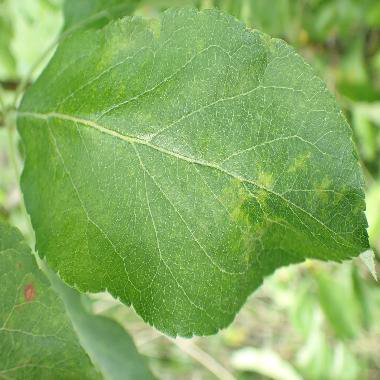

{'complex': 1,
 'complex_true': 0,
 'frog_eye_leaf_spot': 11,
 'frog_eye_leaf_spot_true': 0,
 'healthy': 0,
 'healthy_true': 0,
 'powdery_mildew': 0,
 'powdery_mildew_true': 0,
 'rust': 0,
 'rust_true': 0,
 'scab': 9,
 'scab_true': 11}

8085d341ee57f03f.jpg


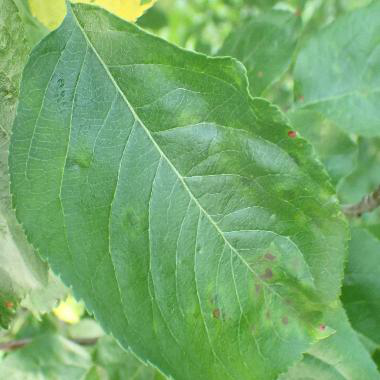

{'complex': 11,
 'complex_true': 13,
 'frog_eye_leaf_spot': 9,
 'frog_eye_leaf_spot_true': 13,
 'healthy': 0,
 'healthy_true': 0,
 'powdery_mildew': 0,
 'powdery_mildew_true': 0,
 'rust': 0,
 'rust_true': 0,
 'scab': 1,
 'scab_true': 0}

808734da3f595b59.jpg


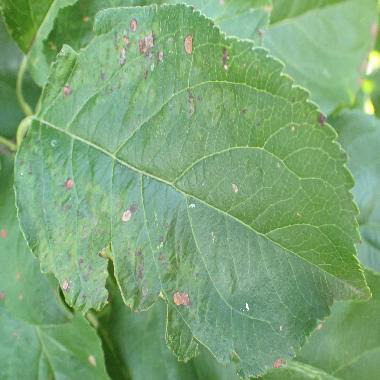

{'complex': 0,
 'complex_true': 8,
 'frog_eye_leaf_spot': 0,
 'frog_eye_leaf_spot_true': 0,
 'healthy': 0,
 'healthy_true': 0,
 'powdery_mildew': 0,
 'powdery_mildew_true': 0,
 'rust': 8,
 'rust_true': 0,
 'scab': 0,
 'scab_true': 0}

809106ca5fc7735f.jpg


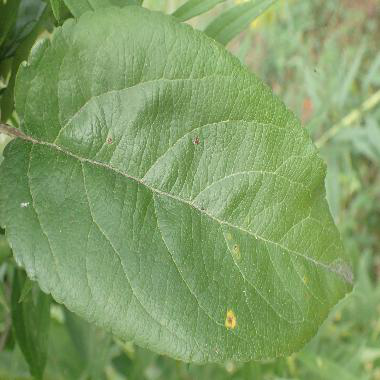

{'complex': 0,
 'complex_true': 0,
 'frog_eye_leaf_spot': 6,
 'frog_eye_leaf_spot_true': 13,
 'healthy': 0,
 'healthy_true': 0,
 'powdery_mildew': 0,
 'powdery_mildew_true': 0,
 'rust': 13,
 'rust_true': 13,
 'scab': 0,
 'scab_true': 0}

80933fcc6a673636.jpg


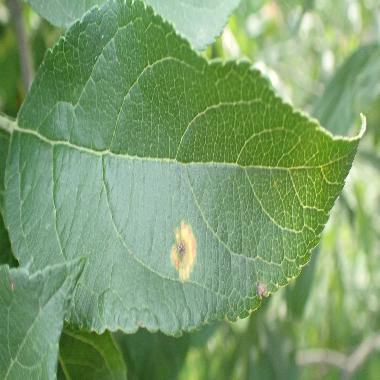

{'complex': 3,
 'complex_true': 13,
 'frog_eye_leaf_spot': 0,
 'frog_eye_leaf_spot_true': 0,
 'healthy': 0,
 'healthy_true': 0,
 'powdery_mildew': 13,
 'powdery_mildew_true': 13,
 'rust': 0,
 'rust_true': 0,
 'scab': 0,
 'scab_true': 0}

809495769b64f3b5.jpg


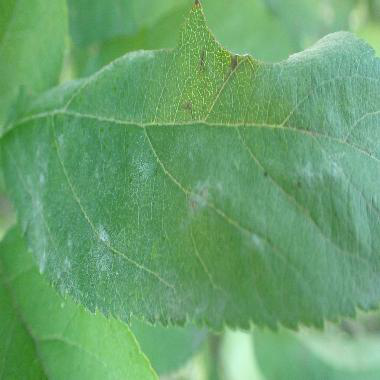

{'complex': 0,
 'complex_true': 0,
 'frog_eye_leaf_spot': 0,
 'frog_eye_leaf_spot_true': 0,
 'healthy': 0,
 'healthy_true': 8,
 'powdery_mildew': 5,
 'powdery_mildew_true': 0,
 'rust': 0,
 'rust_true': 0,
 'scab': 1,
 'scab_true': 0}

80b0b0dacf697db4.jpg


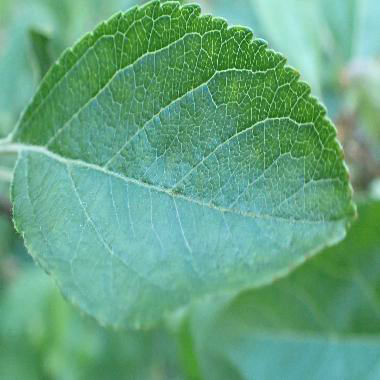

In [31]:
for image in dp.index.tolist()[:10]:
    b = {}
    for i in range(12):
        b[dp.columns.tolist()[i]] = dp.loc[image].tolist()[i]
    b
    print(image)
    img=Image.open(TRAIN_IMG_PATH+image)
    img

In [133]:
b = []
# for i in range(12):
#     b[dp.columns.tolist()[i]] = dp.loc['ffc1039e3dc47490.jpg'].tolist()[i]
for j in range(0,12,2):
    b.append(
        dp.columns.tolist()[j]+' '+
        str(dp.loc['ffc1039e3dc47490.jpg'].tolist()[j])+' '+
        dp.columns.tolist()[j+1]+' '+
        str(dp.loc['ffc1039e3dc47490.jpg'].tolist()[j+1])+' '+
        '\n'
    )
    


In [140]:
print(b[:4])

['complex 11 complex_true 12 \n', 'frog_eye_leaf_spot 4 frog_eye_leaf_spot_true 12 \n', 'healthy 0 healthy_true 0 \n', 'powdery_mildew 0 powdery_mildew_true 0 \n']


In [26]:
TRAIN_IMG_PATH = "/app/_data/cropped_all_v1/"

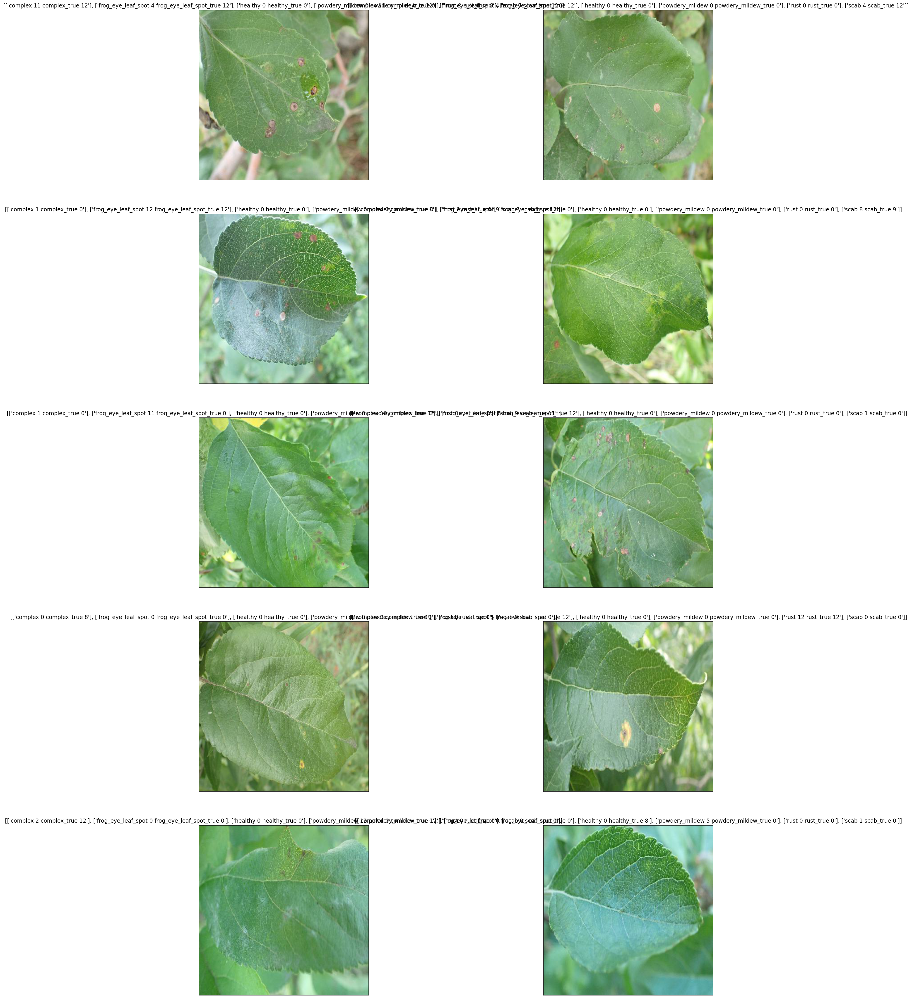

In [152]:
plt.figure(figsize=(25,40))
for i, image in enumerate(dp.index.tolist()[:10]):
    b = []
    for j in range(0,12,2):
        b.append([
            dp.columns.tolist()[j]+' '+
            str(dp.loc[image].tolist()[j])+' '+
            dp.columns.tolist()[j+1]+' '+
            str(dp.loc[image].tolist()[j+1])]
        )

    img = Image.open(TRAIN_IMG_PATH+image)
    plt.subplot(5,2,i+1)
    plt.title(b)
    plt.imshow(img)
#     plt.legend(b, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.xticks([])
    plt.yticks([])
plt.show();

In [10]:
def get_prediction(feature_columns, rescale=True):
    if rescale:
        dg = ImageDataGenerator(rescale = 1. /255)
    else:
        dg = ImageDataGenerator()
    all_img = dg.flow_from_dataframe(
    dataframe=labels,
    directory=IMG_PATH,
    x_col="image",
    y_col=feature_columns,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="raw",
    interpolation = 'bicubic',
    shuffle=False,
)
    prediction_all = model.predict(all_img)
    prediction = pd.DataFrame(prediction_all, columns=feature_columns).join(pd.DataFrame(all_img._targets, columns=feature_columns), rsuffix='_true', lsuffix = '_pred')
    prediction.index = all_img.filenames
    return prediction_all,prediction

In [11]:
def get_metrics(prediction_df, show=True):
    '''
    return metrics_df
    '''
    feature_columns = ['complex', 'frog_eye_leaf_spot', 'healthy', 'powdery_mildew', 'rust', 'scab']
    metrics_df = pd.DataFrame()
    for col in feature_columns:
        pres = metrics.precision_score(prediction_df[col+'_true'], prediction_df[col+'_pred']>0.5)
        rec = metrics.recall_score(prediction_df[col+'_true'], prediction_df[col+'_pred']>0.5)
        f1 = metrics.f1_score(prediction_df[col+'_true'], prediction_df[col+'_pred']>0.5)
        metrics_df.loc['precision', col] = pres
        metrics_df.loc['recall', col] = rec
        metrics_df.loc['f1_score', col] = f1
    if show:
        print(metrics_df)
    return metrics_df

In [12]:
def wrong_prediction(prediction_df, feature_columns, treshold = 0.5):
    '''
    return prediction, wrong_prediction
    '''
    list_wrong_prediction = []
    prediction = prediction_df.copy()
    num_features = len(feature_columns)
    pred_cols = list(x+'_pred' for x in feature_columns)
    prediction[pred_cols] = prediction[pred_cols]>treshold
    prediction[pred_cols] = prediction[pred_cols].replace({True: 1, False: 0})
    if num_features == 5:
        prediction['sum_pred'] = prediction[pred_cols].sum(axis=1)
        prediction['healthy_pred'] = prediction['sum_pred']==0
        prediction['healthy_pred'] = prediction['healthy_pred'].replace({False:0, True:1})
        healthy = labels[['image', 'healthy']]
        healthy.index = healthy['image']
        prediction = prediction.join(healthy['healthy'], how='left', rsuffix='_true')
        prediction['healthy_true'] = prediction['healthy']
        prediction = prediction.drop(['healthy','sum_pred'], axis=1)
    feature_columns = ['complex', 'frog_eye_leaf_spot', 'healthy', 'powdery_mildew', 'rust', 'scab']
    for img in prediction.index.tolist():
        pred_cols = list(x+'_pred' for x in feature_columns)
        real_cols = list(x+'_true' for x in feature_columns)
        pred = prediction.loc[img][pred_cols].values
        real = prediction.loc[img][real_cols].values
        pred_names = ' '.join(list(map(lambda x,y: x*y, pred,feature_columns)))
        pred_names = ' '.join(pred_names.split())
        real_names = ' '.join(list(map(lambda x,y: x*y, real,feature_columns)))
        real_names = ' '.join(real_names.split())
        prediction.loc[img, 'pred_labels'] = pred_names
        prediction.loc[img, 'real_labels'] = real_names    
    ids = prediction[prediction['pred_labels'] != prediction['real_labels']].index.tolist()
    wrong_prediction = prediction.loc[ids]

    return prediction, wrong_prediction

In [13]:
def plot_wrongs(df, num_im = 20):
    plt.figure(figsize=(15,(num_im//4)*5))
    for i, img in enumerate(df.sample(num_im).index.tolist()):
        image = Image.open(IMG_PATH +img)
        plt.subplot(num_im//4, 4, i+1)
        plt.title('predicted: '+df.loc[img,'pred_labels']+ '\nreal: '+df.loc[img,'real_labels'])
        plt.imshow(image)
        plt.xticks([])
        plt.yticks([])
    plt.tight_layout()
    plt.show();

In [14]:
def get_stat(prediction_all, prediction_wrong, feature_columns):
    stat = pd.DataFrame(prediction_wrong[prediction_wrong['pred_labels'] =='']['real_labels'].value_counts())
    stat.columns = ['missing_labels']
    stat = stat.join([prediction_wrong['real_labels'].value_counts(), prediction_wrong['pred_labels'].value_counts()], how='outer')
    stat = stat.join(prediction_all.query('index not in @prediction_wrong.index')['pred_labels'].value_counts(), rsuffix = '_true', how='outer')
    stat.columns = ['missing_labels', 'real_wrong', 'pred_wrong', 'correct_predicted']
    return stat

In [19]:
prediction_all_raw_5, prediction_raw_5 = get_prediction(['complex', 'frog_eye_leaf_spot', 'healthy', 'powdery_mildew', 'rust', 'scab'], rescale=False)

Found 18500 validated image filenames.


In [20]:
prediction_raw_5.to_csv('/app/sandbox/wrong_predictions/prediction_raw_6.csv')

In [39]:
prediction_raw_44 = pd.read_csv('/app/sandbox/wrong_predictions/prediction_raw_4.csv', index_col=[0])

In [40]:
prediction_raw_44.sample()
prediction_raw_4.sample()


,complex_pred,frog_eye_leaf_spot_pred,healthy_pred,powdery_mildew_pred,rust_pred,scab_pred,complex_true,frog_eye_leaf_spot_true,healthy_true,powdery_mildew_true,rust_true,scab_true
988c2ccdc706773e.jpg,0.012054,0.0343,0.009094,0.002378,0.05167,0.8745,0,0,0,0,0,1


,complex_pred,frog_eye_leaf_spot_pred,healthy_pred,powdery_mildew_pred,rust_pred,scab_pred,complex_true,frog_eye_leaf_spot_true,healthy_true,powdery_mildew_true,rust_true,scab_true
9dfd78087ab4c2c4.jpg,0.000584,0.19751,0.120544,0.047058,0.000255,0.135254,0,0,0,0,0,1


In [223]:
prediction_raw_1 = pd.read_csv('/app/sandbox/wrong_predictions/prediction_raw_1.csv', index_col=[0])
prediction_raw_22 = pd.read_csv('/app/sandbox/wrong_predictions/prediction_raw_2.csv', index_col=[0])

In [224]:
prediction_raw_22.sample()
prediction_raw_1.sample()

,complex_pred,frog_eye_leaf_spot_pred,powdery_mildew_pred,rust_pred,scab_pred,complex_true,frog_eye_leaf_spot_true,powdery_mildew_true,rust_true,scab_true
f5d3a38b4ba53118.jpg,0.411219,0.904502,0.001042,0.000732,0.875057,1,1,0,0,0


,complex_pred,frog_eye_leaf_spot_pred,healthy_pred,powdery_mildew_pred,rust_pred,scab_pred,complex_true,frog_eye_leaf_spot_true,healthy_true,powdery_mildew_true,rust_true,scab_true
a497964a48a57b7c.jpg,0.001464,0.001767,0.921016,0.023811,0.001931,0.04624,0,0,0,0,0,1


In [226]:
prediction_all_1, prediction_wrong_1 = wrong_prediction(prediction_raw_1, feature_columns = ['complex', 'frog_eye_leaf_spot', 'healthy', 'powdery_mildew', 'rust', 'scab'])

In [41]:
prediction_all_4, prediction_wrong_4 = wrong_prediction(prediction_raw_4, feature_columns = ['complex', 'frog_eye_leaf_spot', 'healthy', 'powdery_mildew', 'rust', 'scab'])

In [227]:
prediction_all_1.sample()

,complex_pred,frog_eye_leaf_spot_pred,healthy_pred,powdery_mildew_pred,rust_pred,scab_pred,complex_true,frog_eye_leaf_spot_true,healthy_true,powdery_mildew_true,rust_true,scab_true,pred_labels,real_labels
8aed7afd24153852.jpg,0,0,0,0,0,1,0,1,0,0,0,1,scab,frog_eye_leaf_spot scab


In [42]:
metrics_df1 = get_metrics(prediction_all_4)

            complex  frog_eye_leaf_spot   healthy  powdery_mildew      rust  \
precision  0.738077            0.776868  0.853237        0.956274  0.930765   
recall     0.445493            0.852962  0.976108        0.794002  0.832252   
f1_score   0.555621            0.813139  0.910546        0.867615  0.878756   

               scab  
precision  0.919417  
recall     0.587729  
f1_score   0.717074  


In [43]:
metrics_df1.loc['f1_score'].mean()

0.7904585036942046

In [32]:
prediction_wrong_4

,complex_pred,frog_eye_leaf_spot_pred,healthy_pred,powdery_mildew_pred,rust_pred,scab_pred,complex_true,frog_eye_leaf_spot_true,healthy_true,powdery_mildew_true,rust_true,scab_true,pred_labels,real_labels
800113bb65efe69e.jpg,1,1,1,0,1,0,0,0,1,0,0,0,complex frog_eye_leaf_spot healthy rust,healthy
8002cb321f8bfcdf.jpg,1,1,1,0,1,0,1,1,0,0,0,1,complex frog_eye_leaf_spot healthy rust,complex frog_eye_leaf_spot scab
80070f7fb5e2ccaa.jpg,1,1,1,0,1,0,0,0,0,0,0,1,complex frog_eye_leaf_spot healthy rust,scab
80077517781fb94f.jpg,1,1,1,0,1,0,0,0,0,0,0,1,complex frog_eye_leaf_spot healthy rust,scab
800cbf0ff87721f8.jpg,1,1,1,0,1,0,1,0,0,0,0,0,complex frog_eye_leaf_spot healthy rust,complex
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
fffb900a92289a33.jpg,1,1,1,0,1,0,0,0,1,0,0,0,complex frog_eye_leaf_spot healthy rust,healthy
fffc488fa4c0e80c.jpg,1,1,1,0,1,0,0,0,0,0,0,1,complex frog_eye_leaf_spot healthy rust,scab
fffc94e092a59086.jpg,1,1,1,0,1,0,0,0,0,0,1,0,complex frog_eye_leaf_spot healthy rust,rust
fffe105cf6808292.jpg,1,1,1,0,1,0,0,1,0,0,0,1,complex frog_eye_leaf_spot healthy rust,frog_eye_leaf_spot scab


In [33]:
prediction_raw_4

,complex_pred,frog_eye_leaf_spot_pred,healthy_pred,powdery_mildew_pred,rust_pred,scab_pred,complex_true,frog_eye_leaf_spot_true,healthy_true,powdery_mildew_true,rust_true,scab_true
800113bb65efe69e.jpg,0.892578,0.853516,0.997070,0.112549,0.971680,0.171387,0,0,1,0,0,0
8002cb321f8bfcdf.jpg,0.893555,0.852539,0.998047,0.112305,0.971680,0.170532,1,1,0,0,0,1
80070f7fb5e2ccaa.jpg,0.892578,0.852539,0.997070,0.112305,0.971680,0.171509,0,0,0,0,0,1
80077517781fb94f.jpg,0.893555,0.852539,0.997070,0.112793,0.971680,0.171509,0,0,0,0,0,1
800cbf0ff87721f8.jpg,0.892578,0.853516,0.997070,0.112976,0.971680,0.172607,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
fffb900a92289a33.jpg,0.893555,0.851074,0.998047,0.112061,0.970703,0.171753,0,0,1,0,0,0
fffc488fa4c0e80c.jpg,0.891113,0.853516,0.997070,0.113159,0.971680,0.171631,0,0,0,0,0,1
fffc94e092a59086.jpg,0.892578,0.854004,0.998047,0.111877,0.971680,0.169922,0,0,0,0,1,0
fffe105cf6808292.jpg,0.892090,0.854980,0.997070,0.113159,0.971680,0.171875,0,1,0,0,0,1


In [230]:
prediction_all_2, prediction_wrong_2 = wrong_prediction(prediction_raw_2, feature_columns = ['complex', 'frog_eye_leaf_spot', 'powdery_mildew', 'rust', 'scab'])

In [231]:
prediction_all_2.sample()

,complex_pred,frog_eye_leaf_spot_pred,powdery_mildew_pred,rust_pred,scab_pred,complex_true,frog_eye_leaf_spot_true,powdery_mildew_true,rust_true,scab_true,healthy_pred,healthy_true,pred_labels,real_labels
acd58c4b65a533d1.jpg,0,0,0,0,0,0,0,0,0,0,1,1,healthy,healthy


In [232]:
metrics_df2 = get_metrics(prediction_all_2)

            complex  frog_eye_leaf_spot   healthy  powdery_mildew      rust  \
precision  0.873396            0.877538  0.961847        0.963317  0.916156   
recall     0.706465            0.936391  0.991095        0.953433  0.971043   
f1_score   0.781111            0.906010  0.976252        0.958350  0.942802   

               scab  
precision  0.949766  
recall     0.927391  
f1_score   0.938445  


In [233]:
metrics_df2.loc['f1_score'].mean()

0.9171615528201027

In [29]:
stat = get_stat(prediction_all_4, prediction_wrong_4, feature_columns = ['complex', 'frog_eye_leaf_spot', 'healthy', 'powdery_mildew', 'rust', 'scab'])

In [30]:
stat['lab'] = stat.index

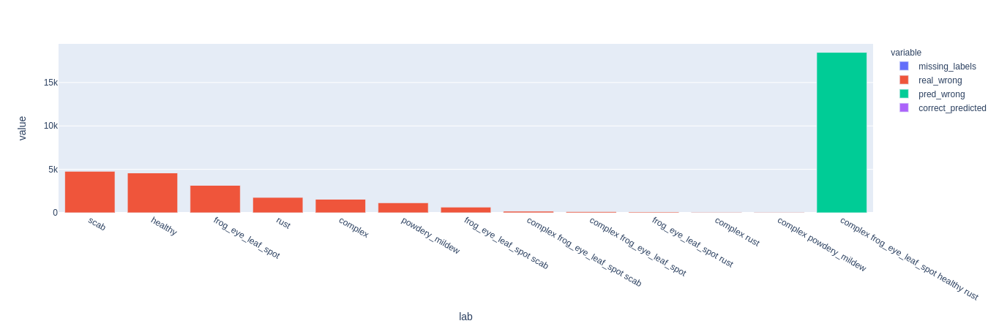

In [31]:
fig = px.bar(data_frame = stat.fillna(0), x = 'lab', y = ['missing_labels', 'real_wrong', 'pred_wrong', 'correct_predicted'])
fig.show();

In [246]:
stat2 = get_stat(prediction_all_2, prediction_wrong_2, feature_columns = ['complex', 'frog_eye_leaf_spot', 'healthy', 'powdery_mildew', 'rust', 'scab'])

In [259]:
stat2['lab'] = stat2.index
stat2

,missing_labels,real_wrong,pred_wrong,correct_predicted,lab
complex,NaN,778.0,166,798.0,complex
complex frog_eye_leaf_spot,NaN,107.0,319,58.0,complex frog_eye_leaf_spot
complex frog_eye_leaf_spot rust,NaN,NaN,2,NaN,complex frog_eye_leaf_spot rust
complex frog_eye_leaf_spot scab,NaN,159.0,143,41.0,complex frog_eye_leaf_spot scab
complex powdery_mildew,NaN,50.0,47,37.0,complex powdery_mildew
complex powdery_mildew scab,NaN,NaN,1,NaN,complex powdery_mildew scab
complex rust,NaN,67.0,54,24.0,complex rust
complex scab,NaN,NaN,24,NaN,complex scab
frog_eye_leaf_spot,NaN,41.0,336,3133.0,frog_eye_leaf_spot
frog_eye_leaf_spot powdery_mildew,NaN,NaN,7,NaN,frog_eye_leaf_spot powdery_mildew


In [261]:
stat2['pred_wrong'].sort_values()

powdery_mildew rust                         1
complex powdery_mildew scab                 1
frog_eye_leaf_spot powdery_mildew scab      1
complex frog_eye_leaf_spot rust             2
rust scab                                   2
powdery_mildew scab                         3
frog_eye_leaf_spot powdery_mildew           7
frog_eye_leaf_spot rust                    12
complex scab                               24
complex powdery_mildew                     47
powdery_mildew                             53
complex rust                               54
scab                                      122
complex frog_eye_leaf_spot scab           143
frog_eye_leaf_spot scab                   160
complex                                   166
healthy                                   181
rust                                      235
complex frog_eye_leaf_spot                319
frog_eye_leaf_spot                        336
Name: pred_wrong, dtype: int64

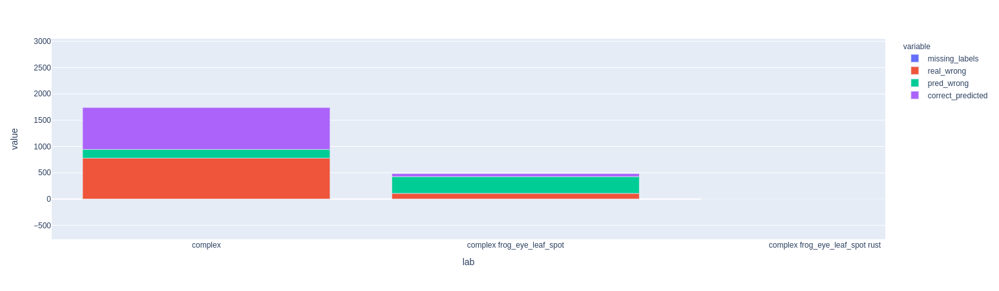

In [260]:
fig = px.bar(data_frame = stat2.fillna(0), x = 'lab', y = ['missing_labels', 'real_wrong', 'pred_wrong', 'correct_predicted'])
fig.show();

In [265]:
prediction_wrong_2.query('pred_labels == "healthy"')[['pred_labels', 'real_labels']]

,pred_labels,real_labels
803553d5df59cac2.jpg,healthy,scab
80afa0c630faab7d.jpg,healthy,complex
81e13ecde4a6f22a.jpg,healthy,scab
81ecf08e963e1f83.jpg,healthy,scab
82ae4a185ebdf14b.jpg,healthy,scab
...,...,...
fce318c6518fd20e.jpg,healthy,scab
fdc5927c98a4c4b2.jpg,healthy,complex
fe35c2293b37b044.jpg,healthy,complex
ff5abca8c03264d8.jpg,healthy,powdery_mildew


In [273]:
prediction_wrong_2.query('pred_labels == "powdery_mildew"')['real_labels'].value_counts(normalize=True)

complex powdery_mildew             0.377358
healthy                            0.301887
scab                               0.169811
complex                            0.094340
complex frog_eye_leaf_spot scab    0.018868
rust                               0.018868
frog_eye_leaf_spot                 0.018868
Name: real_labels, dtype: float64

In [21]:
prediction_all_5, prediction_wrong_5 = wrong_prediction(prediction_raw_5, feature_columns = ['complex', 'frog_eye_leaf_spot', 'healthy', 'powdery_mildew', 'rust', 'scab'])

In [286]:
prediction_wrong_3.shape

(3406, 14)

In [24]:
prediction_wrong_5[prediction_wrong_5['pred_labels'] == '']['real_labels'].value_counts()

complex                            103
scab                                98
rust                                73
healthy                             70
frog_eye_leaf_spot                  68
powdery_mildew                      41
frog_eye_leaf_spot rust             20
frog_eye_leaf_spot scab             17
complex rust                        12
complex powdery_mildew               8
complex frog_eye_leaf_spot           7
complex frog_eye_leaf_spot scab      5
Name: real_labels, dtype: int64

In [26]:
prediction_wrong_5['real_labels'].value_counts()

complex                            928
frog_eye_leaf_spot scab            338
scab                               259
frog_eye_leaf_spot                 254
rust                               165
complex frog_eye_leaf_spot         151
complex frog_eye_leaf_spot scab    147
healthy                            127
frog_eye_leaf_spot rust            118
complex rust                        73
powdery_mildew                      67
complex powdery_mildew              62
Name: real_labels, dtype: int64